# 

In [1]:
! pip install missingno # install the missingno library which is used for checking nas

In [2]:
# import libraries here
import pandas as pd
import missingno as msno # missing values
import numpy as np
import statsmodels.api as sm
import seaborn as sn
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from collections import Counter
from wordcloud import WordCloud, ImageColorGenerator#generate word cloud image and extract color from an image
from folium import plugins
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster

In [3]:
#load the aribnb dataset
airbnb_data = pd.read_csv("FSDS_data/listings.csv")
#load the rental market dataset
housing_data = pd.read_csv('FSDS_data/housing_data.csv',skiprows=2)
#load the geo-spatial data
london_geodata=gpd.read_file('FSDS_data/neighbourhoods.geojson')

/tmp/ipykernel_15558/3508419702.py:2: DtypeWarning: Columns (68) have mixed types. Specify dtype option on import or set low_memory=False.
  airbnb_data = pd.read_csv("FSDS_data/listings.csv")


<Axes: >

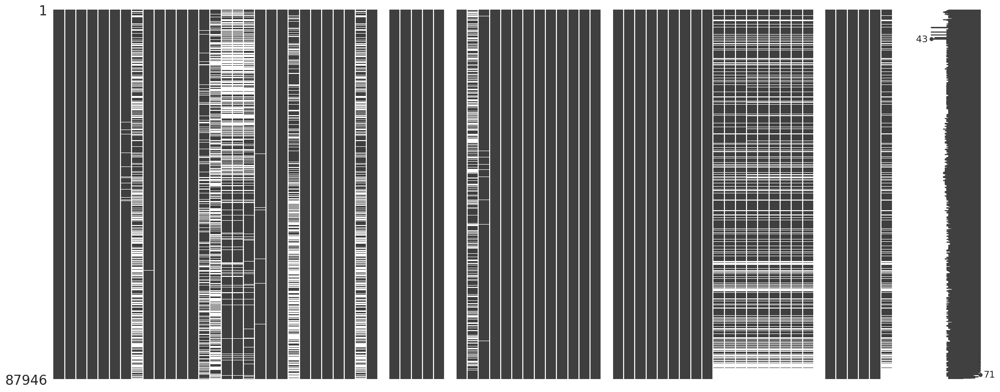

In [4]:
#using the msno matrix to have a quick look about nas in our airbnb dataset
#the white lines here represent missing value so if a column is whole back means there is no na in that column
sn.set(style="ticks")
msno.matrix(airbnb_data)

In [5]:
airbnb_data.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,92644,https://www.airbnb.com/rooms/92644,20230906022807,2023-09-06,city scrape,Rental unit in Earlsfield · ★4.57 · 1 bedroom ...,<b>The space</b><br />Hi everyone! I have 2 ro...,NaN,https://a0.muscache.com/pictures/715127/85bdb4...,498201,...,4.67,4.53,4.68,NaN,t,1,0,1,0,1.45
1,93015,https://www.airbnb.com/rooms/93015,20230906022807,2023-09-06,city scrape,Rental unit in Hammersmith · ★4.82 · 2 bedroom...,Gorgeous 2 bed ground floor apartment with per...,A bit of history about the W14 area: <br />Com...,https://a0.muscache.com/pictures/865937ec-ee56...,499704,...,4.88,4.85,4.74,NaN,f,1,1,0,0,0.27
2,13913,https://www.airbnb.com/rooms/13913,20230906022807,2023-09-06,city scrape,Rental unit in Islington · ★4.80 · 1 bedroom ·...,My bright double bedroom with a large window h...,Finsbury Park is a friendly melting pot commun...,https://a0.muscache.com/pictures/miso/Hosting-...,54730,...,4.82,4.69,4.69,NaN,f,2,1,1,0,0.26
3,15400,https://www.airbnb.com/rooms/15400,20230906022807,2023-09-06,city scrape,Rental unit in London · ★4.80 · 1 bedroom · 1 ...,Lots of windows and light. St Luke's Gardens ...,It is Chelsea.,https://a0.muscache.com/pictures/428392/462d26...,60302,...,4.83,4.93,4.74,NaN,f,1,1,0,0,0.56
4,93734,https://www.airbnb.com/rooms/93734,20230906022807,2023-09-07,city scrape,Condo in London · ★4.62 · 1 bedroom · 1 bed · ...,<b>During your stay</b><br />I’m a professiona...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,497514,...,4.81,4.64,4.67,NaN,f,1,0,1,0,1.21


In [6]:
# Filter out the columns
columns_to_keep = ['name','description', 'host_since', 'host_identity_verified', 'neighbourhood_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'bathrooms_text', 'bedrooms', 'beds', 'number_of_reviews', 'price', 'availability_365']
airbnb_data = airbnb_data[columns_to_keep]

# Filter the data to include only listings that are available
airbnb_data = airbnb_data[airbnb_data['availability_365'] > 0]

#select the numerical columns
numerical_columns = ['price', 'host_since', 'bedrooms', 'beds','latitude','longitude']


# Calculate descriptive statistics for categorical columns
categorical_columns = ['description','name','property_type', 'room_type', 'host_identity_verified','bathrooms_text','neighbourhood_cleansed','number_of_reviews']



#check whether the columns in numerical_columns is numerical or not
for column in numerical_columns:
    if column in airbnb_data.columns:
        print(f"Data type of '{column}': {airbnb_data[column].dtype}")
        if pd.api.types.is_numeric_dtype(airbnb_data[column]):
            print(f"{column} is numeric.")
        else:
            print(f"{column} is not numeric.")
    else:
        print(f"{column} is not in the DataFrame.")


Data type of 'price': object
price is not numeric.
Data type of 'host_since': object
host_since is not numeric.
Data type of 'bedrooms': float64
bedrooms is numeric.
Data type of 'beds': float64
beds is numeric.
Data type of 'latitude': float64
latitude is numeric.
Data type of 'longitude': float64
longitude is numeric.


In [7]:
# as we have price saved as a format like $130,000.00 so we need to deal with the '$' and ',' to convert it to numeric
airbnb_data['price'] = airbnb_data['price'].str.replace('$','', regex=False).str.replace(',','').astype('float')
#convert host_since to the date format 
airbnb_data['host_since'] = pd.to_datetime(airbnb_data['host_since'])

In [8]:
# Define the start and end date for the period
start_date = pd.to_datetime('2017-01-01')
end_date = pd.to_datetime('2018-12-31')

# Filter the DataFrame for rows where the host_since falls within the specified range
airbnb_data = airbnb_data[(airbnb_data['host_since'] >= start_date) & (airbnb_data['host_since'] <= end_date)]

# Display the filtered DataFrame
print(airbnb_data.head())

                                                   name  \
101   Home in Tottenham · ★4.83 · 1 bedroom · 1 bed ...   
1179  Condo in London · ★4.93 · 1 bedroom · 2 beds ·...   
2487  Rental unit in London · ★4.68 · 1 bedroom · 2 ...   
3774  Home in London · ★5.0 · 1 bedroom · 1 bed · 2 ...   
3813  Townhouse in London · ★4.97 · 1 bedroom · 2 be...   

                                            description host_since  \
101   A fantastic, spacious pad for staying in a con... 2018-07-18   
1179  Welcome to your, spacious self-contained apart... 2017-03-09   
2487  Welcome to my home. Enjoy central London livin... 2017-02-23   
3774  Large Double bedroom in a large Victorian Hous... 2017-03-09   
3813  Welcome to the Main's home. Our family love to... 2017-03-09   

     host_identity_verified neighbourhood_cleansed  latitude  longitude  \
101                       t               Haringey  51.58510   -0.10277   
1179                      t             Wandsworth  51.45421   -0.20318   

<Axes: >

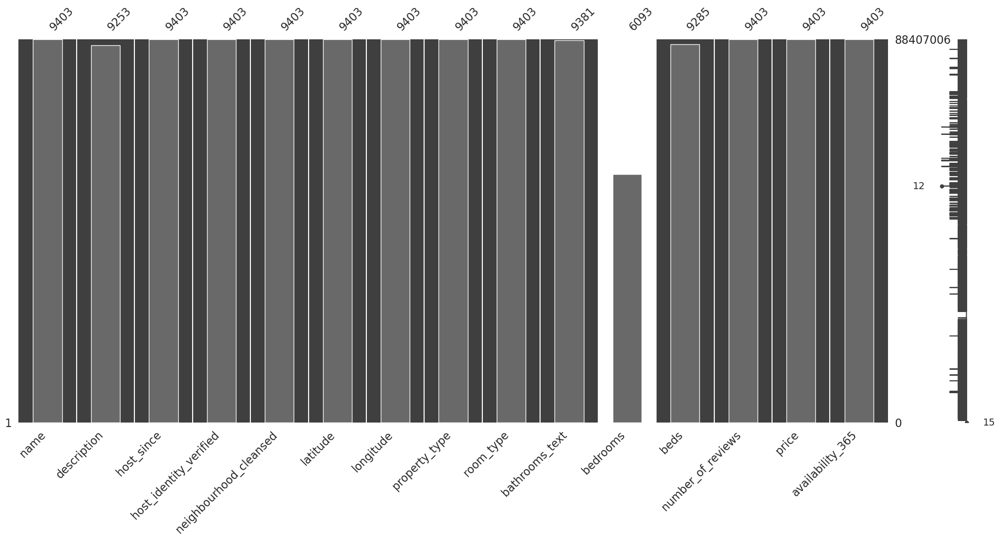

In [9]:
# check the na for airbnb data after selecting the specifc columns as there are only 52 rows containing na for bedroom_text 
# simultaneously, 37965 rows for bedrooms excluding na while other clean column has 57115 rows
# in turn, we have decided to remove those rows contatining na directly
# drop those rows containing na
sn.set(style="ticks")
msno.matrix(airbnb_data)
msno.bar(airbnb_data)

<Axes: >

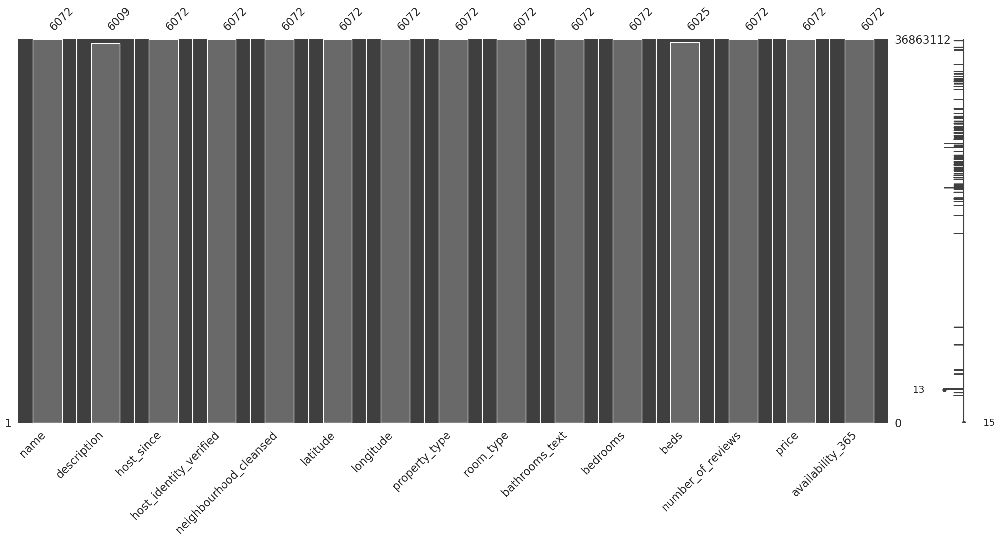

In [10]:
#drop na and empty string for airbnb_data

airbnb_data = airbnb_data[(airbnb_data['bathrooms_text'].notna() & (airbnb_data['bathrooms_text'] != '')) & 
                                   (airbnb_data['bedrooms'].notna() & (airbnb_data['bedrooms'] != ''))]


#drop the na and empty string then check the na again
sn.set(style="ticks")
msno.matrix(airbnb_data)
msno.bar(airbnb_data)

In [11]:
# write the descriptive statistics into a txt file which seems to be easy for analysis

for column in numerical_columns:
    print(f"Descriptive statistics for {column}:")
    print(str(airbnb_data[column].describe()))
     

for column in categorical_columns:
    print(f"Unique values for {column}:\n")
    print(str(airbnb_data[column].value_counts()))
        

Descriptive statistics for price:
count     6072.000000
mean       365.113966
std        545.039359
min          8.000000
25%        135.000000
50%        199.000000
75%        347.250000
max      20362.000000
Name: price, dtype: float64
Descriptive statistics for host_since:
count                             6072
mean     2017-12-06 08:40:47.430829824
min                2017-01-01 00:00:00
25%                2017-05-07 00:00:00
50%                2017-11-10 00:00:00
75%                2018-06-10 00:00:00
max                2018-12-30 00:00:00
Name: host_since, dtype: object
Descriptive statistics for bedrooms:
count    6072.000000
mean        1.738636
std         1.352671
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max        50.000000
Name: bedrooms, dtype: float64
Descriptive statistics for beds:
count    6025.000000
mean        2.136432
std         1.615406
min         1.000000
25%         1.000000
50%         2.000000
75%         3.000000
ma

<Axes: >

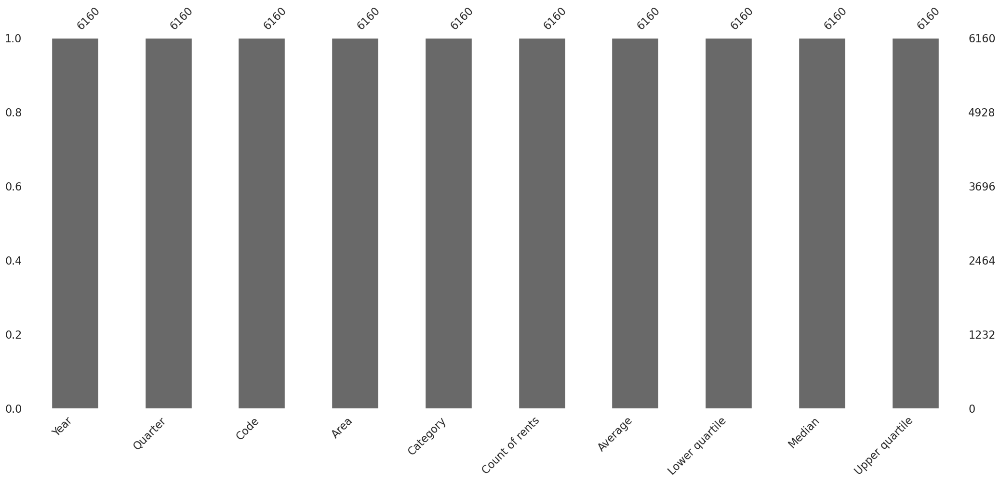

In [12]:
#have a quick look for the na in our housing data
sn.set(style="ticks")
msno.bar(housing_data)

In [13]:
#check the data types for our housing data
housing_data.dtypes

Year               int64
Quarter           object
Code              object
Area              object
Category          object
Count of rents    object
Average           object
Lower quartile    object
Median            object
Upper quartile    object
dtype: object

In [14]:
"""
===
For the descriptive statistics for LTL Data
===
"""
#actually we don't have na in our housing dataset but we have symbol . instead which fill in the empty cell
#set a boolean mask to remove these dots
mask=(housing_data == ".").any(axis=1)
housing_data=housing_data[~mask]

# Filter out the columns
condition = (
    (housing_data['Year'] >= 2016) &
    (housing_data['Year'] <= 2018))

housing_data = housing_data[condition]


#Descriptive statistics for 'Count of rents
print("Descriptive statistics for 'Count of rents':")
print(str(housing_data['Count of rents'].describe()))

#Descriptive statistics for 'Average
print("Descriptive statistics for 'Average':")
print(str(housing_data['Average'].describe()))
    
# Value counts for 'Area'
print("Value counts for 'Area':")
print(str(housing_data['Area'].value_counts()))
   

# Value counts for 'Category'
print("Value counts for 'Category':")
print(str(housing_data['Category'].value_counts()))

Descriptive statistics for 'Count of rents':
count     1835
unique     572
top         20
freq        46
Name: Count of rents, dtype: object
Descriptive statistics for 'Average':
count     1835
unique    1263
top         ..
freq         9
Name: Average, dtype: object
Value counts for 'Area':
Area
Barking and Dagenham        42
Barnet                      42
Redbridge                   42
Richmond upon Thames        42
Southwark                   42
Sutton                      42
Tower Hamlets               42
Waltham Forest              42
Wandsworth                  42
Westminster                 42
NORTH EAST                  42
NORTH WEST                  42
YORKSHIRE AND THE HUMBER    42
EAST MIDLANDS               42
WEST MIDLANDS               42
EAST                        42
LONDON                      42
SOUTH EAST                  42
SOUTH WEST                  42
Inner London                42
Outer London                42
Newham                      42
Merton              

/tmp/ipykernel_15558/1656322605.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sn.distplot(airbnb_data['price'])  # histogram for airbnb's price
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', Tr

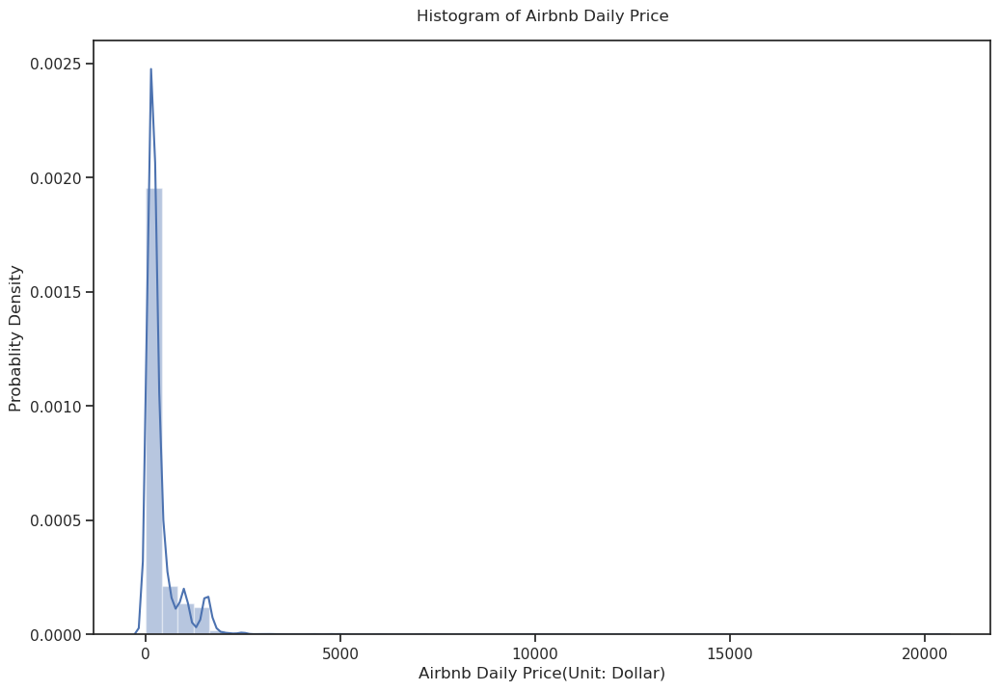

In [15]:
plt.figure(figsize=(12,8))
sn.distplot(airbnb_data['price'])  # histogram for airbnb's price
plt.title('Histogram of Airbnb Daily Price', y=1.02)
plt.ylabel('Probablity Density')
plt.xlabel('Airbnb Daily Price(Unit: Dollar)')
plt.savefig('Histogram_Airbnb_Price.png', bbox_inches='tight') 
plt.show()

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


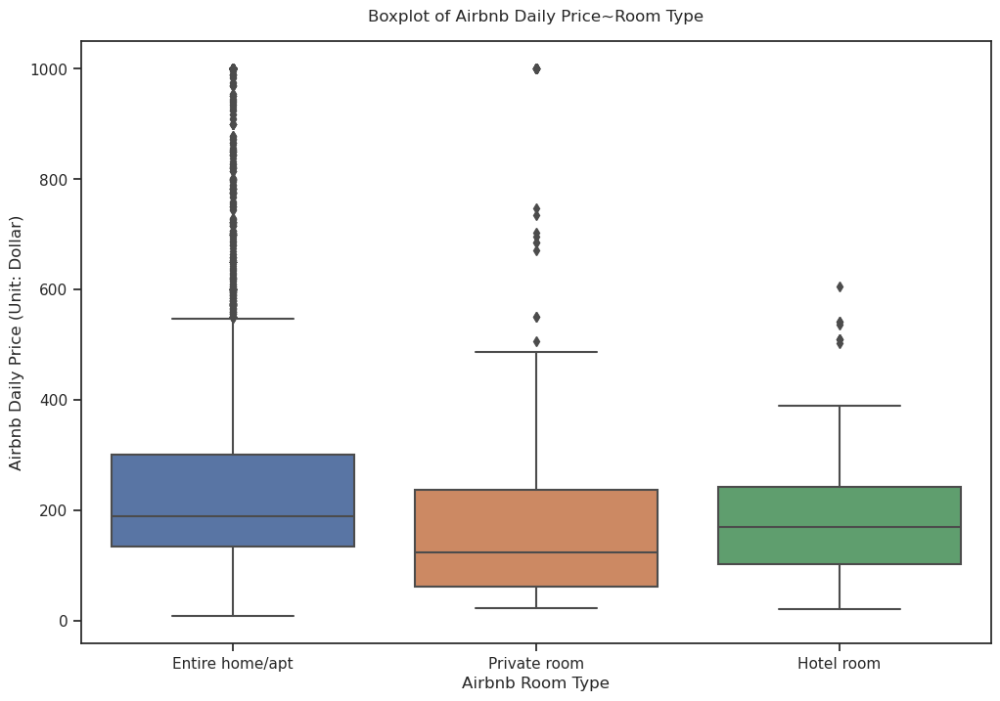

In [16]:
plt.figure(figsize=(12,8))
sn.boxplot(x = 'room_type',
            y = 'price',
            data=airbnb_data[airbnb_data.price<=1000]
           )
plt.ylabel('Airbnb Daily Price (Unit: Dollar)')
plt.xlabel('Airbnb Room Type')
plt.title("Boxplot of Airbnb Daily Price~Room Type",y=1.02)
plt.savefig('Boxplot_Price~Roomtype.png', bbox_inches='tight') 
plt.show()

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


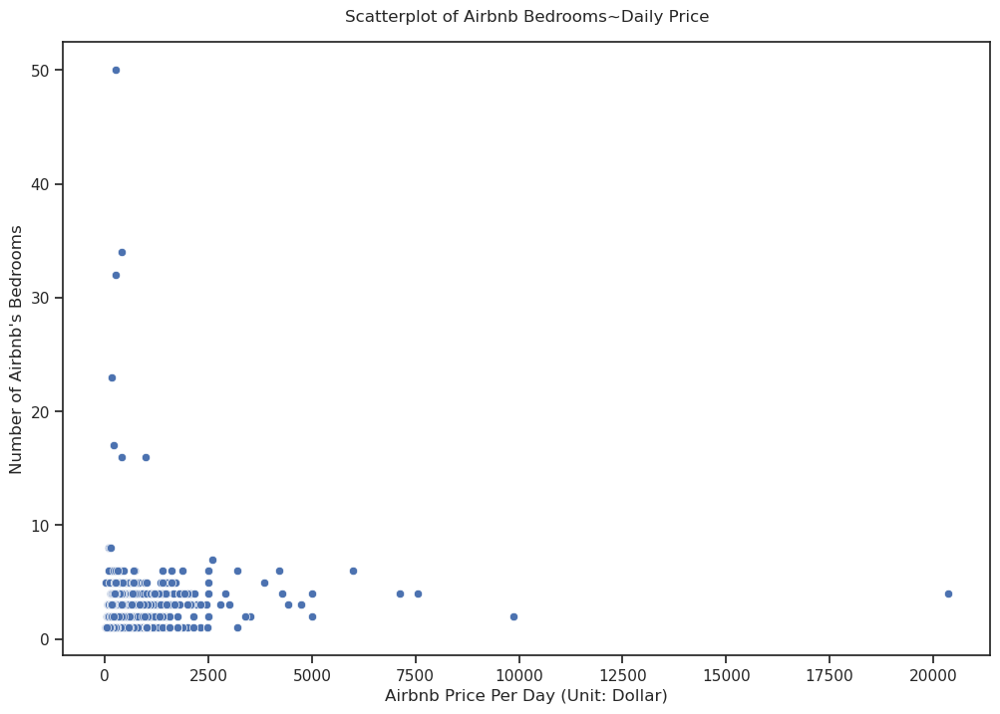

In [17]:
plt.figure(figsize=(12,8))
#plot the scatter plot to see the relationship between prices and numbers of bedrooms
sn.scatterplot(
    x="price",
    y="bedrooms",  
    data=airbnb_data)
plt.ylabel('Number of Airbnb\'s Bedrooms')
plt.xlabel('Airbnb Price Per Day (Unit: Dollar)')
plt.title('Scatterplot of Airbnb Bedrooms~Daily Price', y=1.02)
plt.savefig('Scatterplot_Airbnb_Bedrooms~Price.png') 
plt.show()

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

<Figure size 1200x1000 with 0 Axes>

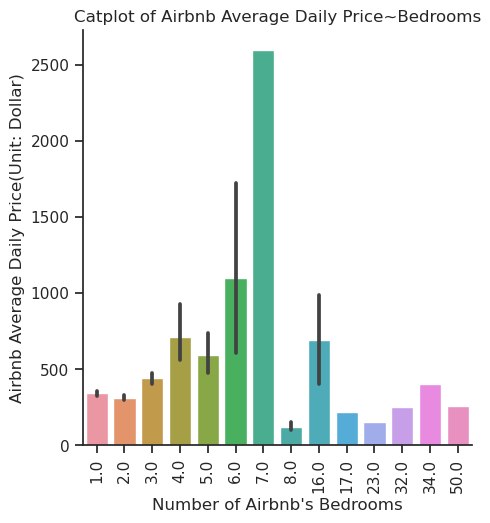

In [18]:
plt.figure(figsize=(12,10))
sn.catplot(x='bedrooms',y='price',data=airbnb_data,kind='bar')
plt.xticks(rotation=90)
#the black vertical line on some bars represent the variablity and uncertianty in the data 
#the longer the line the more disperse the data is 
plt.xlabel('Number of Airbnb\'s Bedrooms')
plt.ylabel('Airbnb Average Daily Price(Unit: Dollar)')
plt.title('Catplot of Airbnb Average Daily Price~Bedrooms')
plt.savefig('Catplot_Airbnb_Price~Bedrooms.png')
plt.show()

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


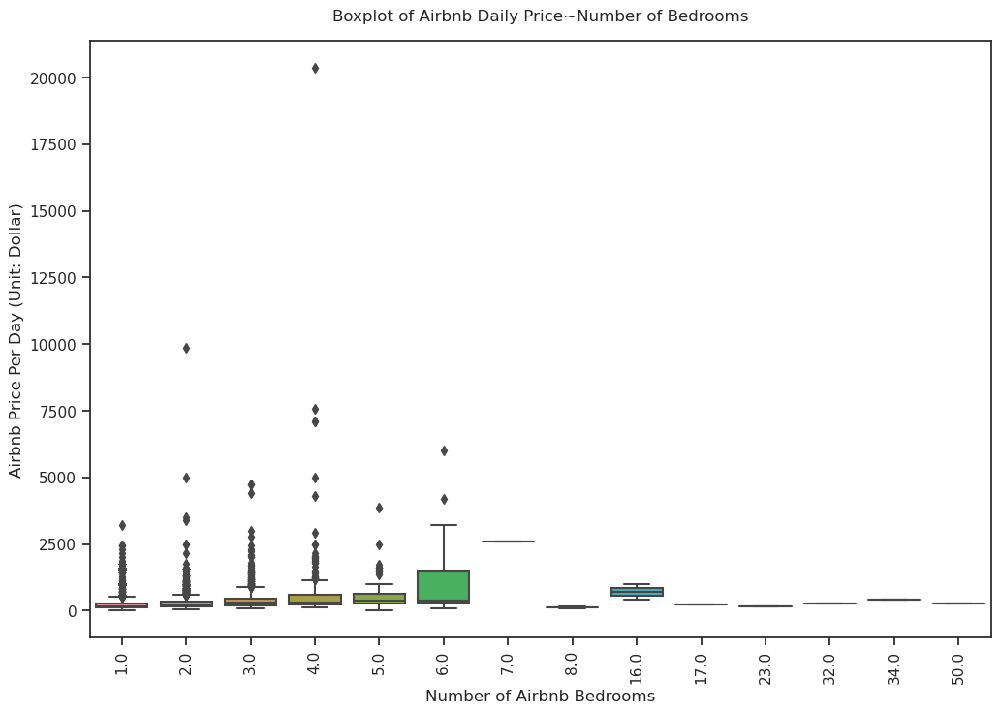

In [19]:
plt.figure(figsize=(12,8))
sn.boxplot(x='bedrooms',y='price',data=airbnb_data)
xt=plt.xticks(rotation=90)
plt.ylabel('Airbnb Price Per Day (Unit: Dollar)')
plt.xlabel('Number of Airbnb Bedrooms')
plt.xticks(rotation=90)
plt.title('Boxplot of Airbnb Daily Price~Number of Bedrooms', y=1.02)
plt.savefig('Boxplot_Airbnb_Price_Bedrooms.png') 

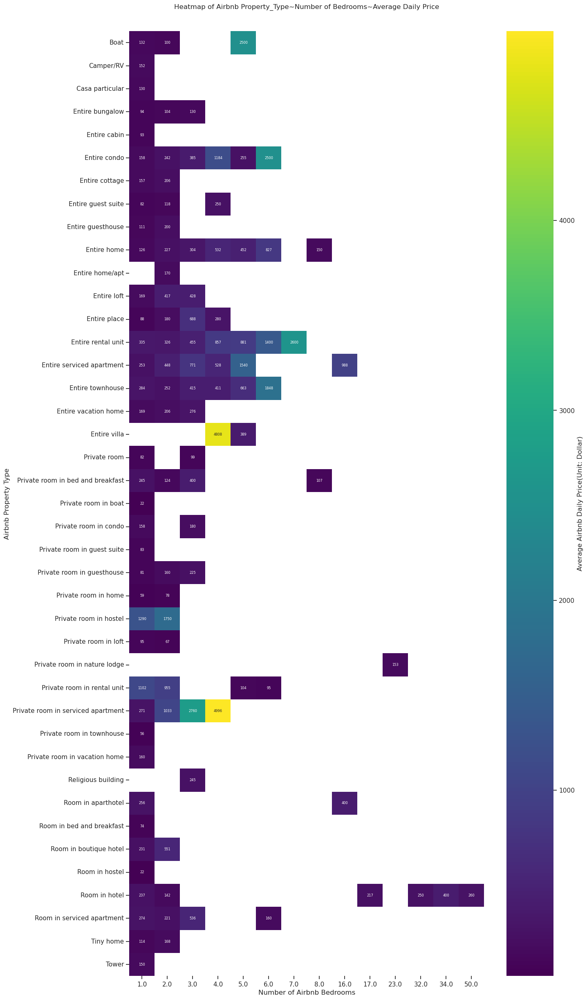

In [20]:
#plotting the heatmap of average price of airbnb in different property types with numbers of bedrooms 
# the deep yellow color here means the combination of property types and numbers of bedrooms which has the highest average price per day
plt.figure(figsize=(14, 30))

# Generate the heatmap with smaller annotations to fit more property types
price_mean = airbnb_data.groupby(['property_type', 'bedrooms'])['price'].mean().unstack()
ax=sn.heatmap(price_mean, annot=True, fmt='.0f', annot_kws={"size": 6},cmap='viridis')
plt.yticks(rotation=0)
plt.ylabel('Airbnb Property Type')
plt.xlabel('Number of Airbnb Bedrooms')
plt.title('Heatmap of Airbnb Property_Type~Number of Bedrooms~Average Daily Price', y=1.02)
colorbar = ax.collections[0].colorbar
colorbar.set_label('Average Airbnb Daily Price(Unit: Dollar)')
#annotation means the average price of that property type which has certain number of bedrooms
plt.savefig('Heatmap_Airbnb_Propertytype~Bedrooms~Averageprice.png') 

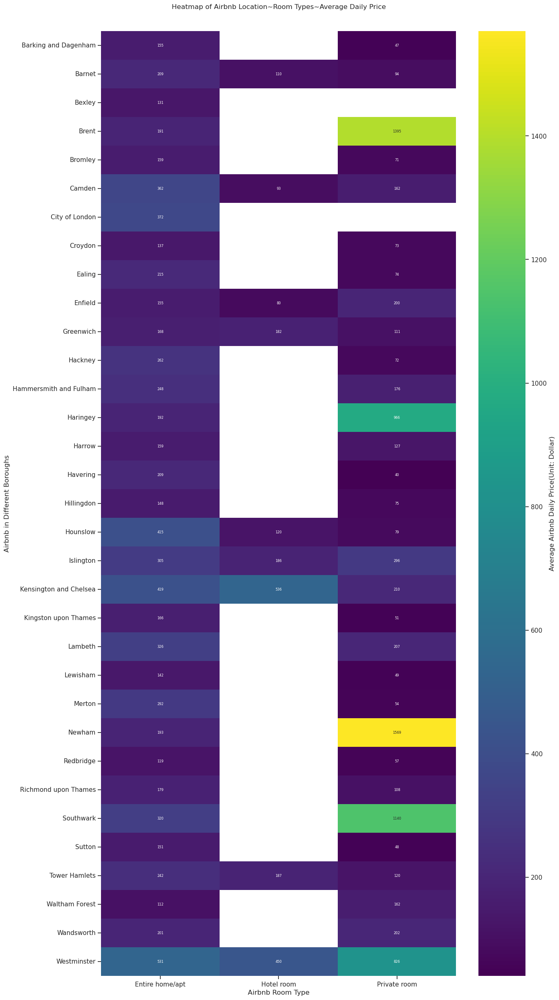

In [21]:
#plotting the heatmap of average price of airbnb in different with specific room types 
# the deep yellow color here means the combination of borough and room types which has the highest average price per day
plt.figure(figsize=(14, 30))

# Generate the heatmap with smaller annotations to fit more property types
price_mean = airbnb_data.groupby(['neighbourhood_cleansed', 'room_type'])['price'].mean().unstack()
ax=sn.heatmap(price_mean, annot=True, fmt='.0f', annot_kws={"size": 6},cmap='viridis')
plt.yticks(rotation=0)
plt.ylabel('Airbnb in Different Boroughs')
plt.xlabel('Airbnb Room Type')
plt.title('Heatmap of Airbnb Location~Room Types~Average Daily Price', y=1.02)
colorbar = ax.collections[0].colorbar
colorbar.set_label('Average Airbnb Daily Price(Unit: Dollar)')
#annotation means the average price of that property type which has certain number of bedrooms
plt.savefig('Heatmap_Airbnb_Location_Propertytype_Averageprice.png') 

In [22]:
print(airbnb_data['property_type'].unique())

['Entire rental unit' 'Entire home' 'Private room in guesthouse'
 'Entire bungalow' 'Entire townhouse' 'Entire serviced apartment'
 'Entire condo' 'Entire loft' 'Entire guest suite'
 'Room in serviced apartment' 'Private room in rental unit' 'Entire cabin'
 'Entire place' 'Room in bed and breakfast' 'Private room in loft'
 'Private room in home' 'Entire guesthouse' 'Entire vacation home'
 'Private room in guest suite' 'Entire cottage' 'Private room'
 'Private room in bed and breakfast' 'Tiny home' 'Room in boutique hotel'
 'Private room in hostel' 'Room in hotel'
 'Private room in serviced apartment' 'Entire villa' 'Room in aparthotel'
 'Private room in condo' 'Private room in townhouse' 'Room in hostel'
 'Private room in boat' 'Entire home/apt' 'Boat'
 'Private room in nature lodge' 'Religious building'
 'Private room in vacation home' 'Camper/RV' 'Tower' 'Casa particular']


/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


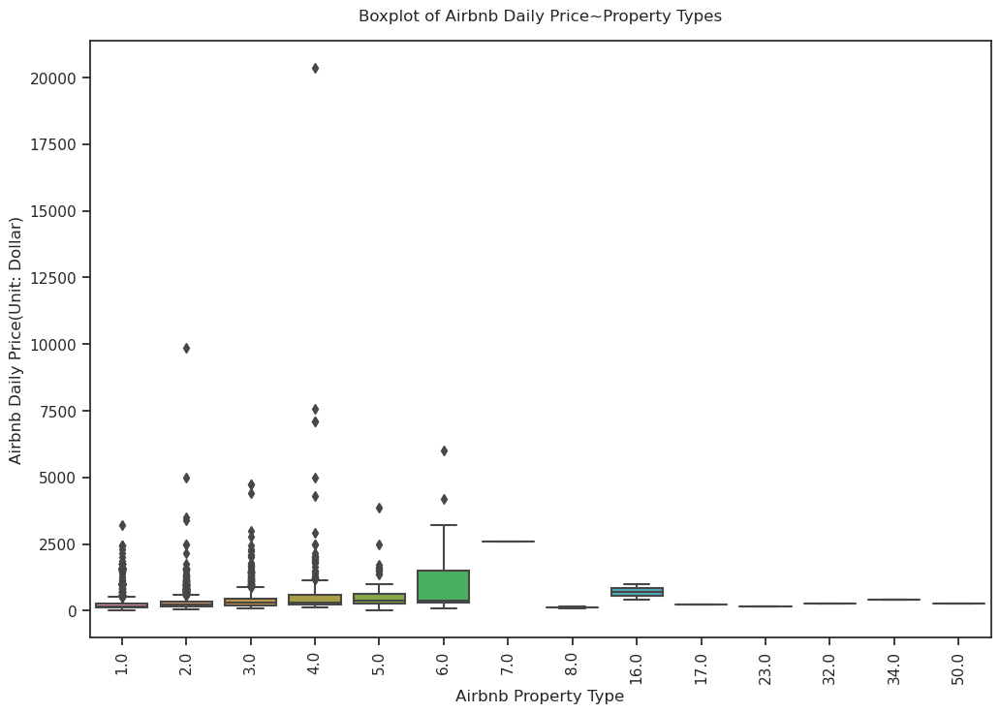

In [23]:
plt.figure(figsize=(12,8))
sn.boxplot(x='bedrooms',y='price',data=airbnb_data)
xt=plt.xticks(rotation=90)
plt.ylabel('Airbnb Daily Price(Unit: Dollar)')
plt.xlabel('Airbnb Property Type')
plt.xticks(rotation=90)
plt.title('Boxplot of Airbnb Daily Price~Property Types', y=1.02)
plt.savefig('Boxplot_Airbnb_Price~Property_Types.png') 

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


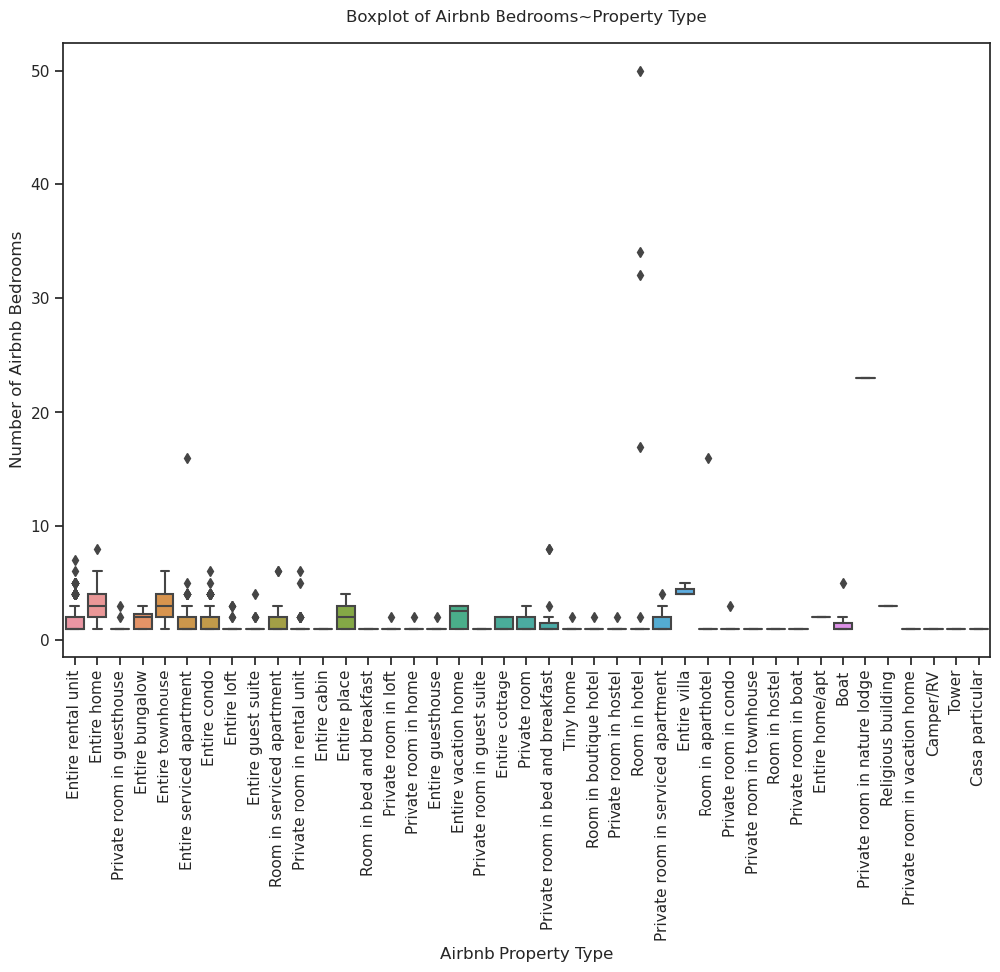

In [24]:
plt.figure(figsize=(12,8))
sn.boxplot(x='property_type',y='bedrooms',data=airbnb_data)
xt=plt.xticks(rotation=90)
plt.ylabel('Number of Airbnb Bedrooms')
plt.xlabel('Airbnb Property Type')
plt.xticks(rotation=90)
plt.title('Boxplot of Airbnb Bedrooms~Property Type', y=1.02)
plt.savefig('Boxplot_Airbnb_Bedroom~Property_Types.png') 

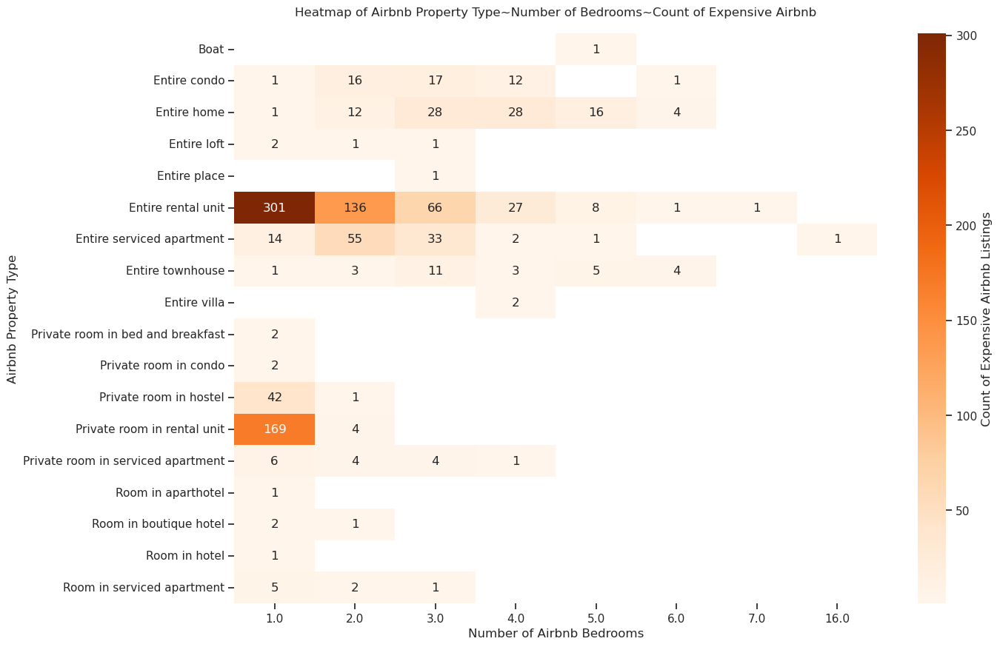

In [25]:
#plotting a heatmap showing the airbnb property type of certain numbers of bedroom has the most count of
#high daily price(price>500)
airbnb_data_filtered = airbnb_data[airbnb_data['price'] >=500]
# Group by 'property_type' and 'bedrooms', and get the count of 'price'
grouped = airbnb_data_filtered.groupby(['property_type', 'bedrooms'])['price'].count().reset_index(name='count')
# Pivot the DataFrame for the heatmap
pivot_table = grouped.pivot(index='property_type', columns='bedrooms', values='count')
# Create the heatmap
f, ax = plt.subplots(figsize=(14, 10))
heatmap=sn.heatmap(pivot_table, cmap='Oranges', annot=True, fmt='.0f')
plt.xlabel('Number of Airbnb Bedrooms')
plt.ylabel('Airbnb Property Type')
cbar =heatmap.collections[0].colorbar
cbar.set_label('Count of Expensive Airbnb Listings')
plt.title('Heatmap of Airbnb Property Type~Number of Bedrooms~Count of Expensive Airbnb', y=1.02)
plt.savefig('Heatmap_Airbnb_Property_type~bedrooms~Count_of_Expensive_Airbnb.png') 
                                                 

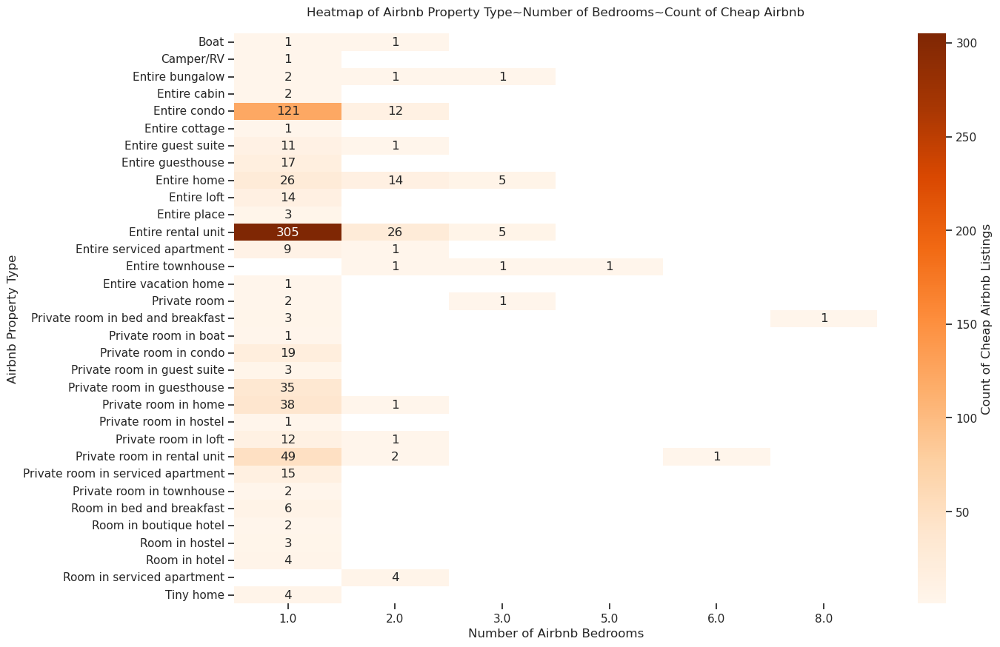

In [26]:
#plotting a heatmap showing the airbnb property type of certain numbers of bedroom has the most count of
#high daily price(price>500)
airbnb_data_filtered = airbnb_data[airbnb_data['price'] <=100]
# Group by 'property_type' and 'bedrooms', and get the count of 'price'
grouped = airbnb_data_filtered.groupby(['property_type', 'bedrooms'])['price'].count().reset_index(name='count')
# Pivot the DataFrame for the heatmap
pivot_table = grouped.pivot(index='property_type', columns='bedrooms', values='count')
# Create the heatmap
f, ax = plt.subplots(figsize=(14, 10))
heatmap=sn.heatmap(pivot_table, cmap='Oranges', annot=True, fmt='.0f')
cbar =heatmap.collections[0].colorbar
cbar.set_label('Count of Cheap Airbnb Listings')
plt.xlabel('Number of Airbnb Bedrooms')
plt.ylabel('Airbnb Property Type')
plt.title('Heatmap of Airbnb Property Type~Number of Bedrooms~Count of Cheap Airbnb', y=1.02)
plt.savefig('Heatmap_Airbnb_Property_type~bedrooms~Count_of_Cheap_Airbnb.png') 

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


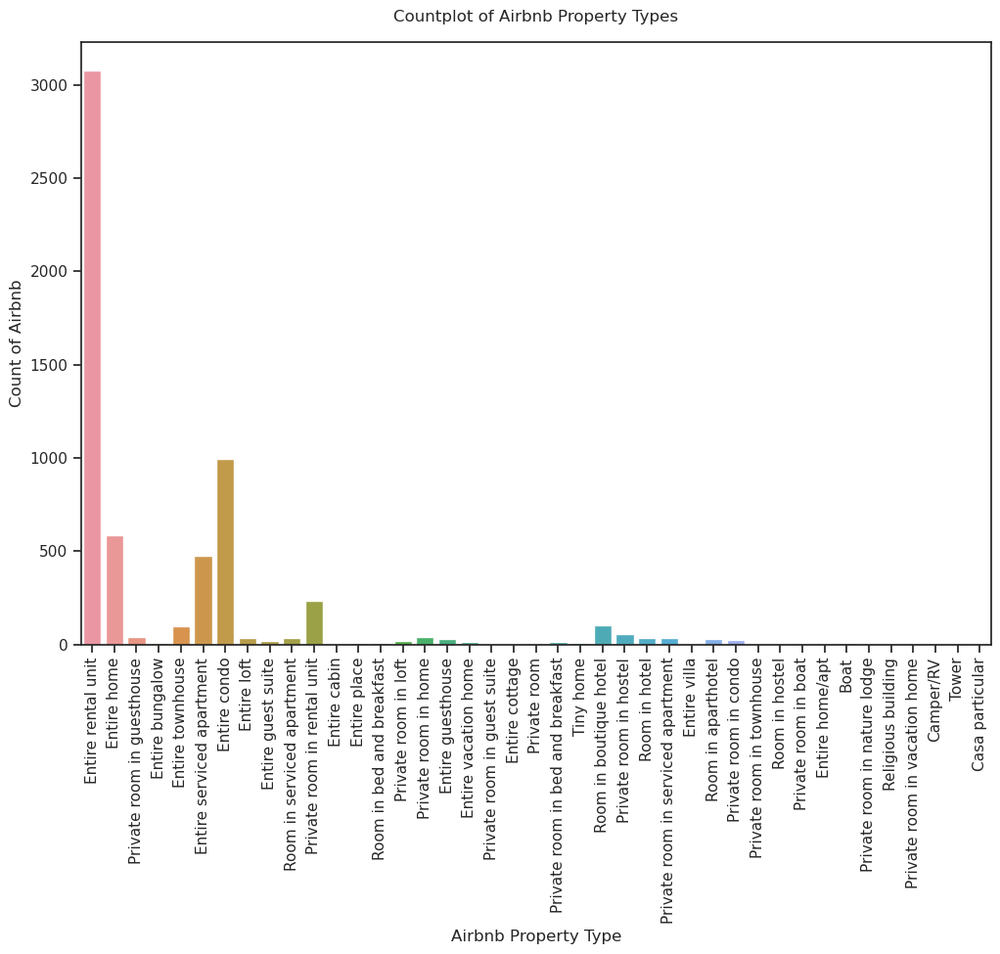

In [27]:
plt.figure(figsize=(12,8))
sn.countplot(x="property_type", data=airbnb_data)
plt.xticks(rotation=90)
plt.ylabel('Count of Airbnb')
plt.xlabel('Airbnb Property Type')
plt.title('Countplot of Airbnb Property Types', y=1.02)
plt.savefig('Countplot_Airbnb_Property_Types.png') 
plt.show()

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


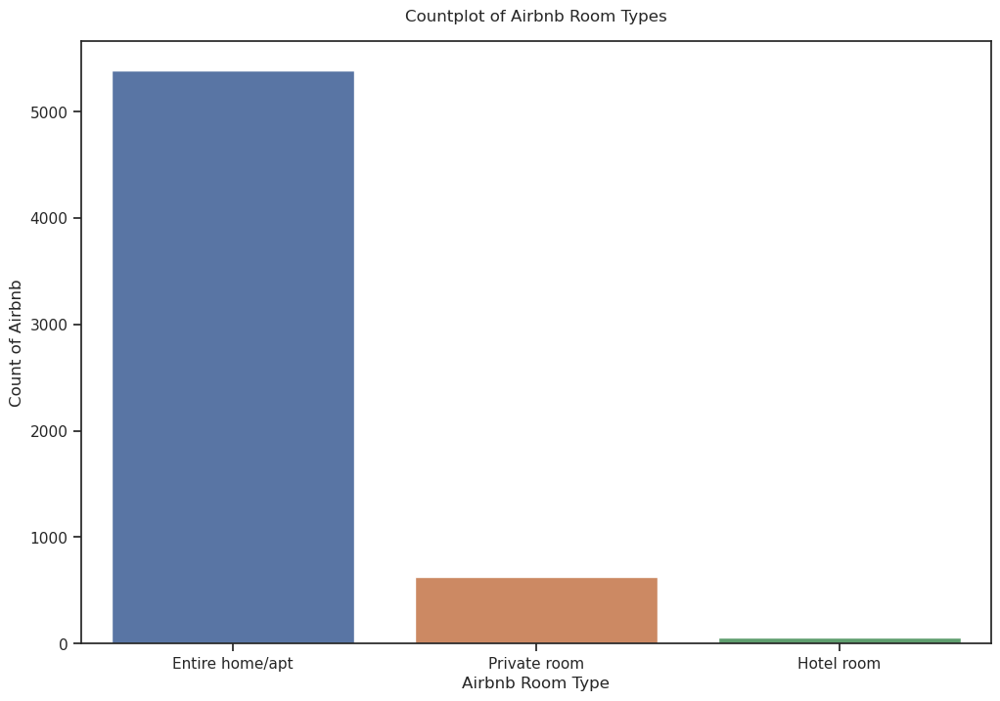

In [28]:
plt.figure(figsize=(12,8))
sn.countplot(x="room_type", data=airbnb_data)
plt.ylabel('Count of Airbnb')
plt.xlabel('Airbnb Room Type')
plt.title('Countplot of Airbnb Room Types', y=1.02)
plt.savefig('Countplot__Room_Types.png') 
plt.show()

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

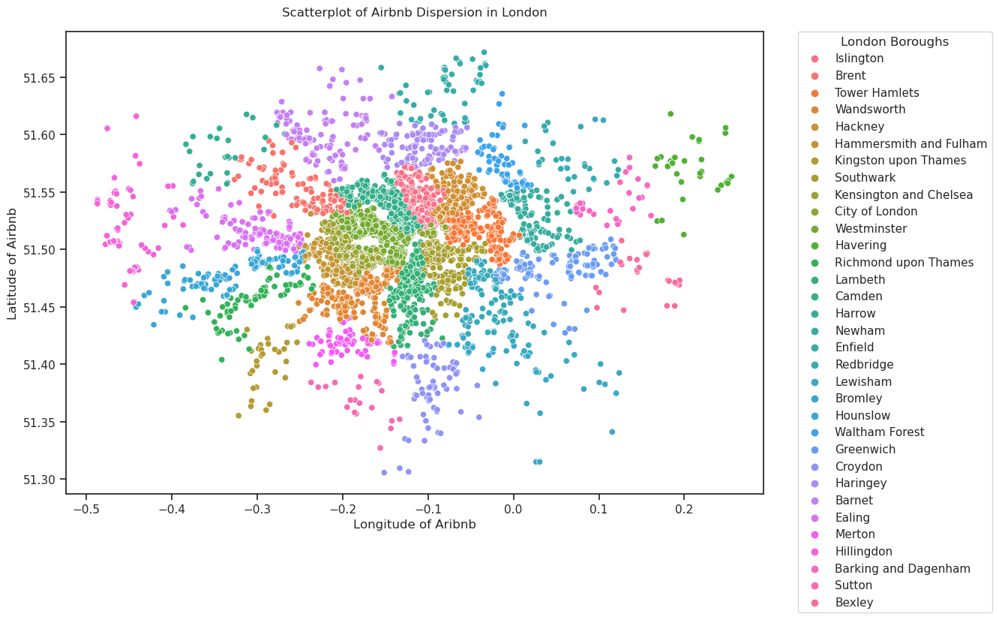

In [29]:
plt.figure(figsize=(12,8))
sn.scatterplot(data=airbnb_data, x='longitude', y='latitude', hue='neighbourhood_cleansed')
plt.ylabel('Latitude of Airbnb')
plt.xlabel('Longitude of Aribnb')
plt.title('Scatterplot of Airbnb Dispersion in London', y=1.02)
# Place the legend outside the plot
legend = plt.legend(title='London Boroughs', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.savefig('Scatterplot_Airbnb_Dispersion.png', bbox_inches='tight') 
plt.show()

In [31]:
#An interactive map that visually represents the density of Airbnb listings in the area around the specified coordinates. 
#Denser areas with more Airbnb listings will appear with colors closer to red in the specified gradient
#while less dense areas will appear blue, purple, or orange, depending on their concentration.
map = folium.Map([51.5074,-0.1278],zoom_start=11)
#the exact longitude and latitude of London Area is search from Google


#Add a heatmap layer to the map which visualizes the density of Airbnb listings based on their geographical locations.
#Also defines the color scheme of the heatmap while lower density areas in blue and higher in red 
HeatMap(airbnb_data[['latitude','longitude']].dropna(),
        radius=10,
        gradient={0.2:'blue',
                  0.4:'purple',
                  0.6:'orange',
                  1.0:'red'}).add_to(map)
display(map)
map.save("Interactivemap_Airbnb_listings_.html")
#Noting here, for Juptyer notebook users you will see an interactive map which can be zoomed in as it's in html format
#for other users using traditional ide users they can't see it

In [ ]:
plt.figure(figsize=(12,8))

plt.scatter(airbnb_data.longitude,
           airbnb_data.latitude,
            c=airbnb_data.availability_365,
            cmap="spring",
            edgecolors="black",
            linewidths=1,
            alpha=1
           )
cbar = plt.colorbar()
cbar.set_label("Airbnb Days Available in a Year")
plt.xlabel('Airbnb Longitude')
plt.ylabel('Airbnb Latitude')
plt.title('Airbnb Availability and Location',y=1.02)
plt.savefig('Scatterplot_Airbnb_location_Availability.png', bbox_inches='tight') 
plt.show()

In [ ]:
plt.figure(figsize=(12,8))
sn.countplot(
    data = airbnb_data,
    x="room_type",
    hue="property_type"
)
plt.xticks(rotation=90)
plt.ylabel('Count of Airbnb')
plt.xlabel('Airbnb Room Type')
legend = plt.legend(title='Airbnb Property Type', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title("Airbnb Room Types in Different Property Types")
plt.savefig('Countplot_Airbnb_Roomtype_Propertytype_Dispersion.png', bbox_inches='tight') 
plt.show()

In [ ]:
plt.figure(figsize=(12,8))

sn.countplot(
    data = airbnb_data,
    x="room_type",
    hue="neighbourhood_cleansed"
)
plt.ylabel('Count of Airbnb')
plt.xlabel('Airbnb Room Type')
legend = plt.legend(title='London Boroughs', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title("Different Airbnb Room Type's Dispersion in London Boroughs")
plt.savefig('Countplot_Airbnb_Roomtype_Neighbourhoodgroup_Dispersion.png', bbox_inches='tight') 
plt.show()

In [ ]:
#Combining all entries from the name column of the airbnb_data DataFrame into a single string, with each name converted to a string
text = " ".join(str(each) for each in airbnb_data.description)
#Creating a WordCloud object with a maximum of 200 words to be included in the word cloud
#set the background color of the word cloud to white
wordcloud = WordCloud(
    max_words=200,
    background_color="white").generate(text)

plt.figure(figsize=(10,6))
plt.figure(figsize=(15,10))
#Displaying the generated word cloud image on the current figure with bilinear interpolation, which smooths the displayed image
plt.imshow(wordcloud, interpolation="Bilinear")
plt.savefig('Airbnb_Description_Keyword.png', bbox_inches='tight') 
plt.axis("off")
plt.show()#overall we're plotting the keyword for the airbnb's name here

In [37]:
#Plotting the area which has the most revies and each marker in the map represents an individual Airbnb listing
# By zooming in, more markers become visible and you can more information about the distribution of listings. 
#and the map is focused on the central London area as hte point is specifically near the Charing Cross area 
Longitude=-0.1278
Latitude=51.5074

#This creates a new Folium map centered at the central lodon 
map = folium.Map([Latitude, Longitude], zoom_start=10)

#Initialize a marker cluster and adds it to the map. Marker clusters can help manage the clusters at different locations. 
#When many markers are close together, they are grouped into a cluster.
reviews_map = plugins.MarkerCluster().add_to(map)

#Loop iterates over the latitude, longitude, and name of each Airbnb listing.
#For each listing, a marker will be created on the map with an icon and a popup label which is the name of the listing.
for lat, lon, label in zip(airbnb_data.latitude,airbnb_data.longitude,airbnb_data.name):
    folium.Marker(location=[lat, lon],icon=folium.Icon(icon="home"),
                 popup=label).add_to(reviews_map)

#Add the marker cluster to the map
map.add_child(reviews_map)
display(map)
reviews_map.save("Interactive_Map_Most_Reviews.html")

In [ ]:
"""
===
Diagrams and histograms to visualize the results
===
"""

In [ ]:
"""
===
Heatmap for London's Airbnb by London's Airbnb's density
===
"""

In [ ]:
# """
# ===
# Reproduce the model from the literature review
# ===
# """





# # Define the treatment and control groups
# treatment_cities = ['Taipei', 'New Taipei City', 'Taoyuan City']
# control_cities = ['Kaohsiung', 'Tainan', 'Chiayi City']

# treatment_period = [2015, 2016, 2017]
# control_period = [2018, 2019, 2020]

# # Create the treatment and control variables
# treatment = np.zeros(len(data))
# for i in range(len(data)):
#     if data.loc[i, 'city'] in treatment_cities and data.loc[i, 'year'] in treatment_period:
#         treatment[i] = 1

# control = np.zeros(len(data))
# for i in range(len(data)):
#     if data.loc[i, 'city'] in control_cities and data.loc[i, 'year'] in control_period:
#         control[i] = 1

# # Create the interaction variable
# interaction = treatment * control

# # Define the dependent variable (housing rental price)
# rent = data['rent']

# # Estimate the DID model
# model = sm.OLS(rent, sm.add_constant([treatment, control, interaction]))
# results = model.fit()

# # Print the results
# print(results.summary())

# # Extract the coefficient of the interaction variable
# coefficient_interaction = results.params['interaction']

# # Calculate the effect of Airbnb on housing rental prices
# effect_airbnb = coefficient_interaction * 100

# print('The estimated effect of Airbnb on housing rental prices is:', effect_airbnb, '%')
